## Visualization of CNN: Grad-CAM
* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.

<center> DARGIER Antoine </center>
<center> DOUILLY Thomas </center>

<center> 13/02/2023 </center>

In [1]:
!pip install wget

Defaulting to user installation because normal site-packages is not writeable


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request
import random
import wget
import zipfile

import numpy as np
from PIL import Image

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [3]:
resnet34 = models.resnet34(pretrained=True)
resnet34.eval() # set the model to evaluation mode

C:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)


Input image must be of size (3x224x224). 

First convolution layer with maxpool. 
Then 4 ResNet blocks. 

Output of the last ResNet block is of size (512x7x7). 

Average pooling is applied to this layer to have a 1D array of 512 features fed to a linear layer that outputs 1000 values (one for each class). No softmax is present in this case. We have already the raw class score!

In [4]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class 
print(classes)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [5]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [6]:
# The images should be in a *sub*-folder of "data/" (ex: data/TP2_images/images.jpg) and *not* directly in "data/"!
# otherwise the function won't find them

import os

try:
    os.mkdir("data")
except:
    0
    
try:
    os.mkdir("data/TP2_images")
except:
    0

In [7]:
os.chdir("data/TP2_images")

In [8]:
wget.download("https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip")

with zipfile.ZipFile("TP2_images.zip", 'r') as zip_ref:
    zip_ref.extractall(".")

100% [..........................................................................] 1477062 / 1477062

In [9]:
os.chdir("../../")

In [10]:
dir_path = "data/" 
dataset = preprocess_image(dir_path)

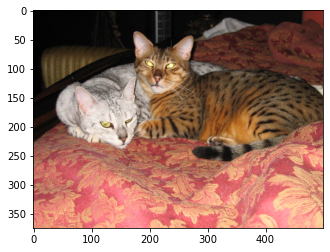

In [11]:
# show the orignal image 
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [12]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.077123 10.977326 10.554378]


### Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 


* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully. 
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’
- | - 
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

## Solution (code and comments)

### Hooks function:

A hook is a function that gets executed when a certain event occurs within the model. In this case, the hook is registered for the convolutional layer (conv2) in the last block (-1) of the last layer (layer4) in the model (self.model).

* We need first a forward hook, which will record the output of the feature maps. It will be executed during the forward pass of the model, when the inputs are being processed and the outputs are being computed. The hook function is used to save the activations of this particular layer.

* Then we need to record the grad_output of the features maps. A backward hook is a function that gets executed during the backward pass of the model, when the gradients with respect to the parameters and inputs are being computed. This hook function is used to save the gradients of this particular layer. 

### Grad-CAM algorithm

Grad-CAM (Gradient-weighted Class Activation Mapping) is a technique for visualizing the important regions in an image that a convolutional neural network (CNN) uses to make a prediction. It's a very important techniques in the interpretability of the Deep-Learning models. Here are the steps of the Grad-CAM algorithm:

* Forward Pass: Pass the input image through the CNN to obtain the class predictions
* Compute Gradients: Compute the gradient of the target class score with respect to each feature map of the last convolutional layer
* Global Average Pooling: Apply global average pooling to each feature map to obtain a weight value for each feature map.
* Weighted Sum: Weight each feature map by its corresponding weight value and sum them up to obtain a weighted feature map.
* ReLU: Apply ReLU activation function to obtain a final activation map.
* Resize and Heatmap Overlay: Resize the activation map to the same size as the original image and overlay it as a heatmap on the image. This heatmap represents the class-discriminative regions in the image.

In [13]:
class GradCAM():
    def __init__(self, model):
        """
        initialize all parameters needed: model, activations, gradients, hooks for activations and gradients
        """
        #model
        self.model = model
        # Activations
        self.activations = []
        #Gradients
        self.gradients = []
        
        # Hooks
        #for the activations
        self.model.layer4[-1].conv2.register_forward_hook(self.save_activations)
        #for the gradients
        self.model.layer4[-1].conv2.register_full_backward_hook(self.save_gradients)

    def save_activations(self, model, input_layer, output_layer):
        """
        Save the activations of the output_layer, computed during a forward pass, using the data attribute
        """
        self.activations = output_layer.data


    def save_gradients(self, model, input_gradient, output_gradient):
        """
        Save the activations of the output_gradient, computed during a backward pass
        """
        self.gradients = output_gradient[0]

    def compute_Grad_CAM_top3(self, image):
        """
        Choose the top-3 possible labels as the desired classes. Compute the Grad-CAM and return the heatmaps
        1) forward pass
        2) return the indices of top-3 possible classes
        3) backpropagate the gradient from the relevant class
        4) compute the weights for each features map with global average pooling
        5) compute the weighted sum and apply ReLU activation
        """
        # Forward pass
        output = self.model(image)
        # Find the indices of the top 3 classes
        _, indices = torch.topk(output, 3)

        
        heatmaps = []
        predicted_labels = []
        i=1
        for top_k in range(3):
            idx = indices[0][top_k]
            # Backpropagation from the relevant indice
            output[0, idx].backward(retain_graph=True)
            # Average pooling to compute the weights
            weights = torch.nn.AvgPool2d(self.gradients.shape[2:])(self.gradients)
            # create the heatmap
            heatmap = torch.relu(torch.sum(self.activations * weights, 1))
            # Project the heatmap to the resized image (224x224)
            heatmap = nn.functional.interpolate(heatmap[None, ...], image.shape[2:], mode="bilinear")
            
            # store the heatmaps as 2D tensors
            heatmaps.append(heatmap[0,0,...])
            # store predicted labels list
            predicted_labels.append(idx.item())
        return heatmaps, predicted_labels

In [14]:
resnet34 = models.resnet34(pretrained=True)
resnet34.eval() # set the model to evaluation mode
grad_cam = GradCAM(resnet34)

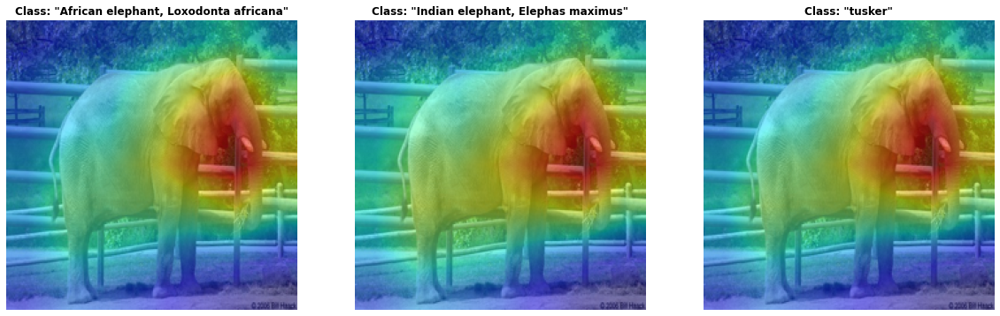

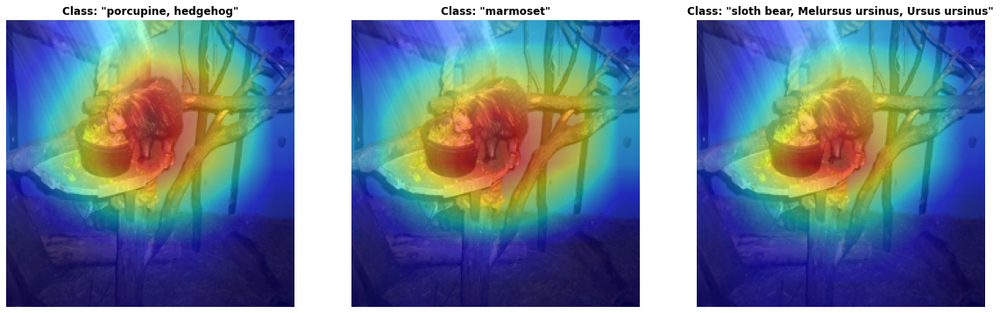

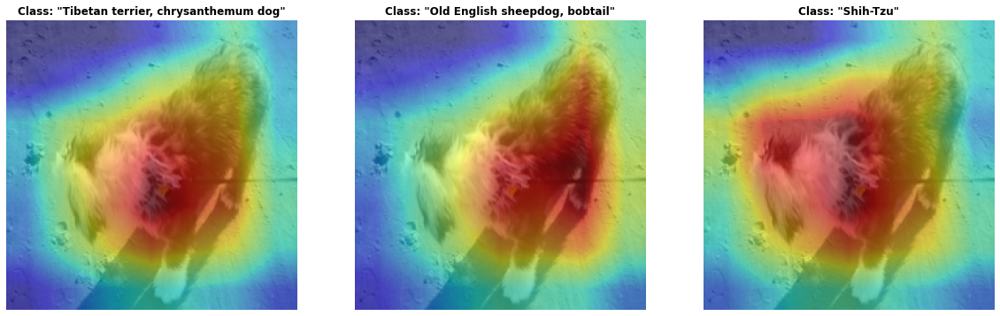

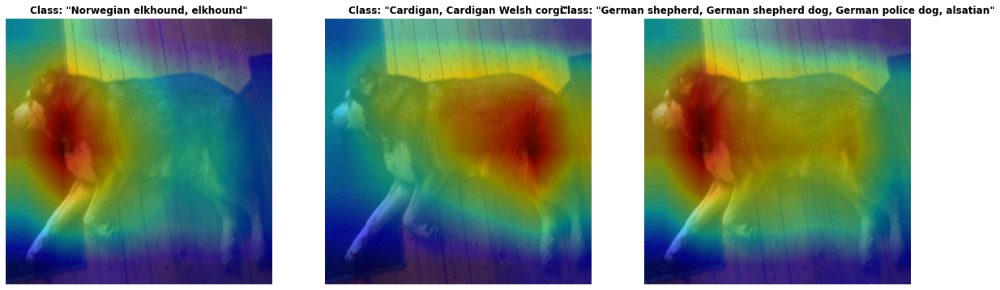

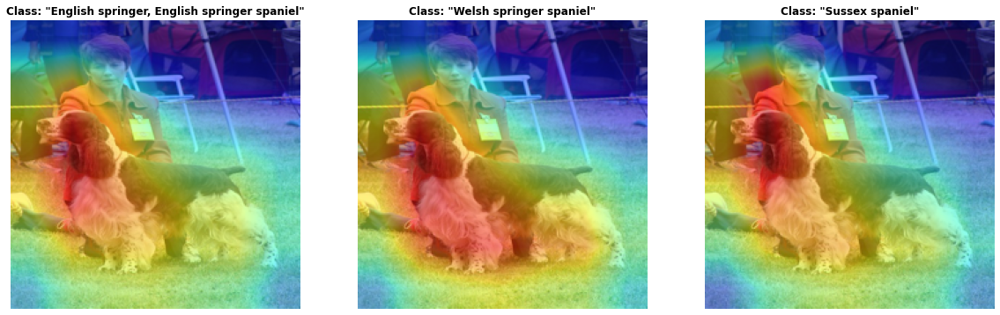

...

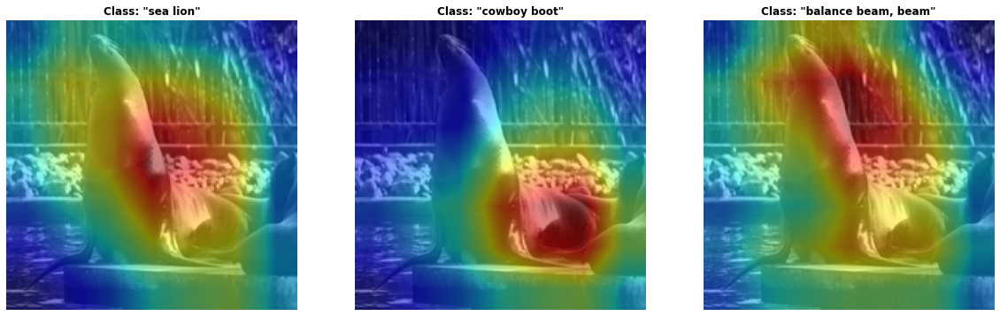

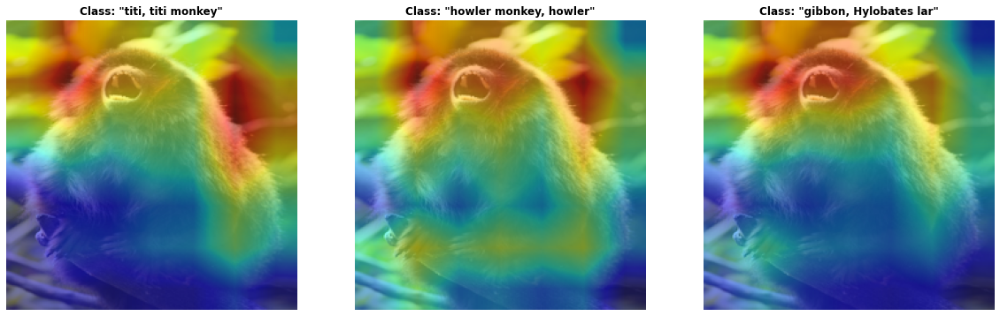

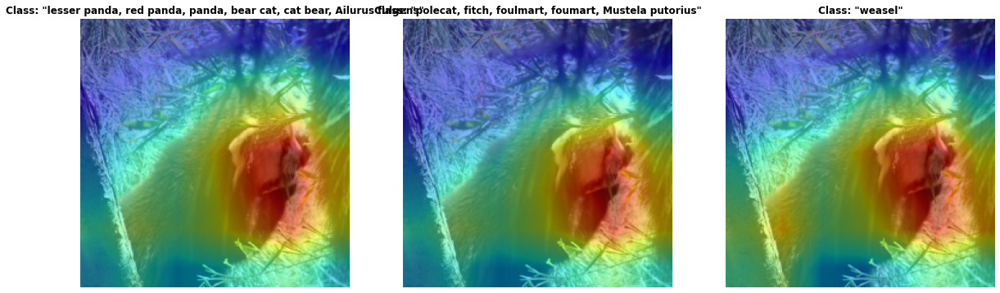

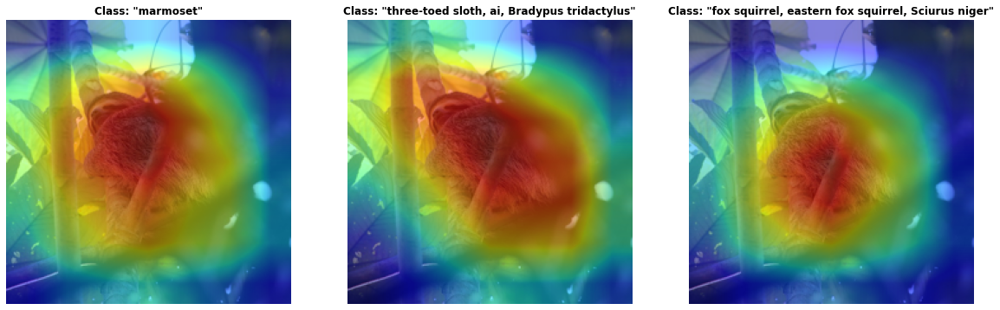

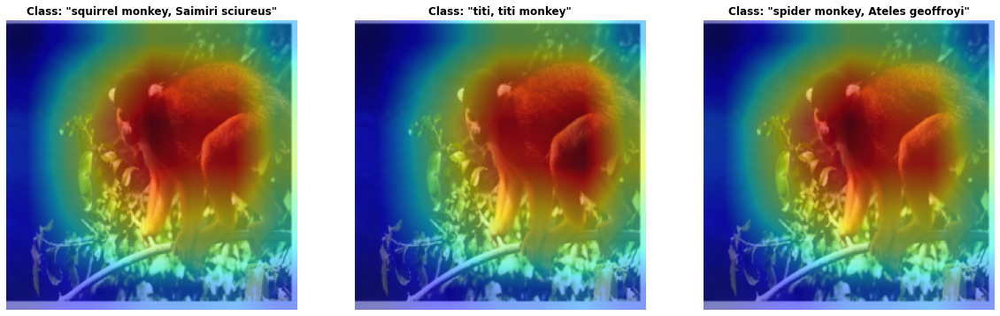

In [15]:
for image_index in range(len(dataset)):
    heatmaps, predicted_labels = grad_cam.compute_Grad_CAM_top3(dataset[image_index][0].view(1, 3, 224, 224))
    img = Image.open(dataset.imgs[image_index][0]).convert('RGB')
    img = img.resize((224,224))
    plt.figure(figsize=(20,10))
    for i in range(len(heatmaps)):
        plt.subplot(1,3,i+1)
        plt.imshow(img)
        plt.title(f'Class: "{classes[predicted_labels[i]]}"', fontweight="bold")
        #plt.imshow(heatmaps[i], alpha=0.5)
        plt.imshow(heatmaps[i], cmap='jet', alpha=0.5)
        plt.axis('off')

### Conclusion

Globally, we can see that the Grad-CAM is very good, and the results are very logical. The main discriminators are well detected, either the animals or specific characteristics (e.g. horns for bighorns). There are not big differences between the labels, and so the area of interest are the same for the 3 pictures.

However, when the labels are not good, the results can be very surprising. For the sea lion, when it is classified as "cowboy boot", the region of interest is the folds of the body of the animal, whereas otherwise it is more the flipper and neck that are detected. This is also the case with the gallinule, which relies on straw to detect scorpions. Here we can assume that the model has made a connection between this type of soil and scorpions, probably because of the training set. It would have to rely on real scorpion characteristics to detect them more accurately. And for the dog, the prediction is again the worst when the interest zone is not the best.

In conclusion, Grad-CAM is a powerful tool for visualizing the important regions in an image that a CNN uses to make a prediction. It provides an effective way to interpret and understand the decision-making process of CNNs, which is especially useful for improving model transparency and debugging performance issues. By using Grad-CAM, we can gain a deeper understanding of how CNNs work, and ultimately improve their performance in real-world applications.